In [ ]:
# Imports generales
import pandas as pd
import io
from google.colab import files
import numpy as np
import time

missing_values = ["?"]

def upload_files (index_fields=None):
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')), index_col = index_fields, na_values = missing_values)

    return df

df = upload_files()
print(df.shape)

Saving MI.data to MI.data
User uploaded file "MI.data" with length 453535 bytes
(1700, 124)


TABLEONE

In [ ]:
!pip install tableone

In [ ]:
from tableone import TableOne, load_dataset
import pandas as pd
mytable = TableOne(df)
print(mytable.tabulate(tablefmt = "fancy_grid"))

╒═══════════════════════╤═════╤═══════════╤═══════════════╕
│                       │     │ Missing   │ Overall       │
╞═══════════════════════╪═════╪═══════════╪═══════════════╡
│ n                     │     │           │ 1700          │
├───────────────────────┼─────┼───────────┼───────────────┤
│ ID, mean (SD)         │     │ 0         │ 850.5 (490.9) │
├───────────────────────┼─────┼───────────┼───────────────┤
│ AGE, mean (SD)        │     │ 8         │ 61.9 (11.3)   │
├───────────────────────┼─────┼───────────┼───────────────┤
│ SEX, n (%)            │ 0   │ 0         │ 635 (37.4)    │
├───────────────────────┼─────┼───────────┼───────────────┤
│                       │ 1   │           │ 1065 (62.6)   │
├───────────────────────┼─────┼───────────┼───────────────┤
│ INF_ANAM, n (%)       │ 0.0 │ 4         │ 1060 (62.5)   │
├───────────────────────┼─────┼───────────┼───────────────┤
│                       │ 1.0 │           │ 410 (24.2)    │
├───────────────────────┼─────┼─────────

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


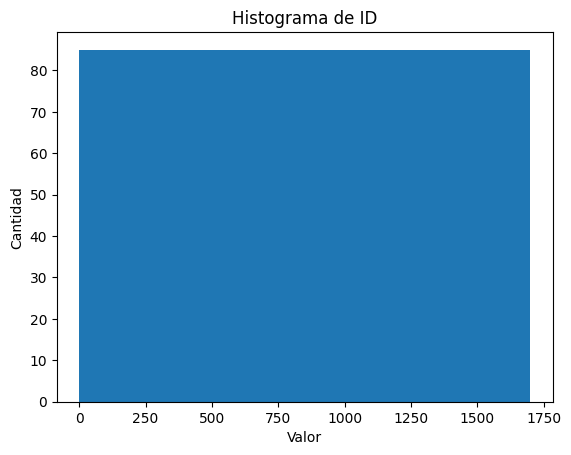

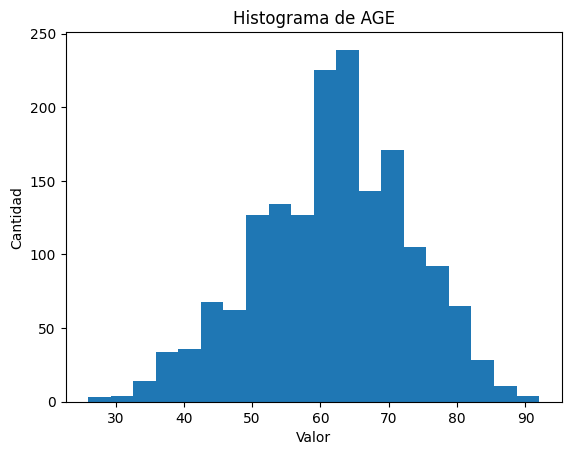

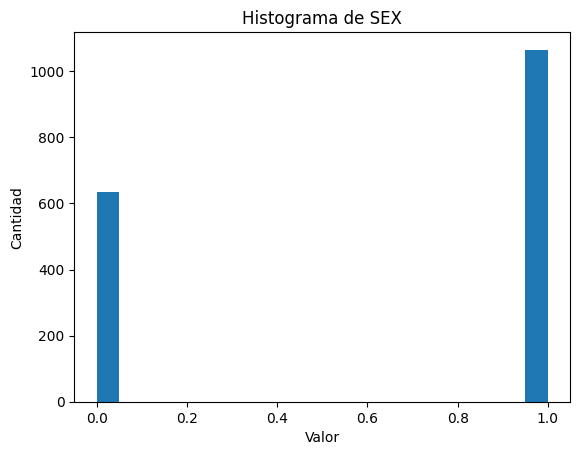

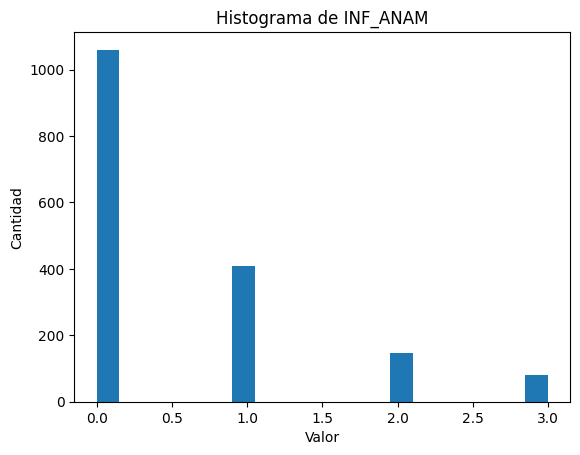

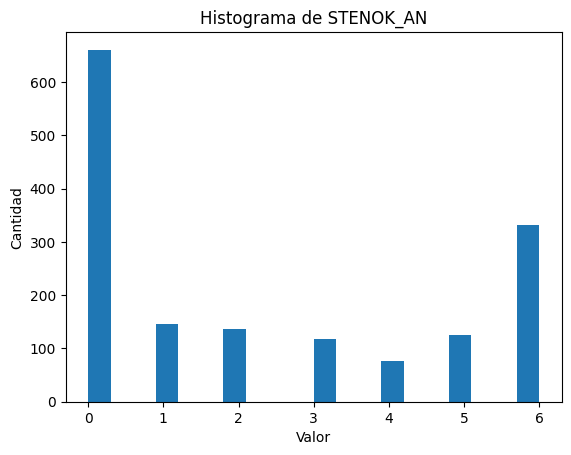

...

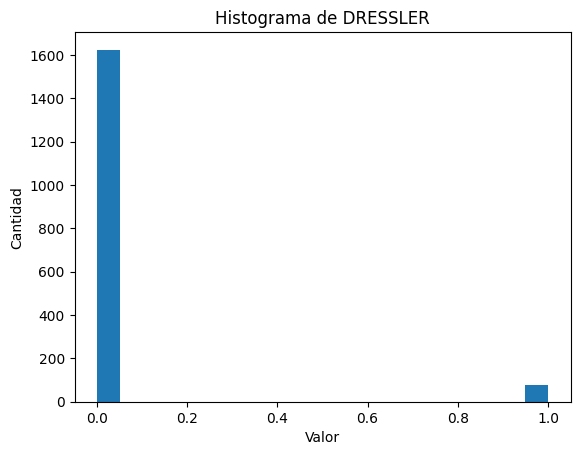

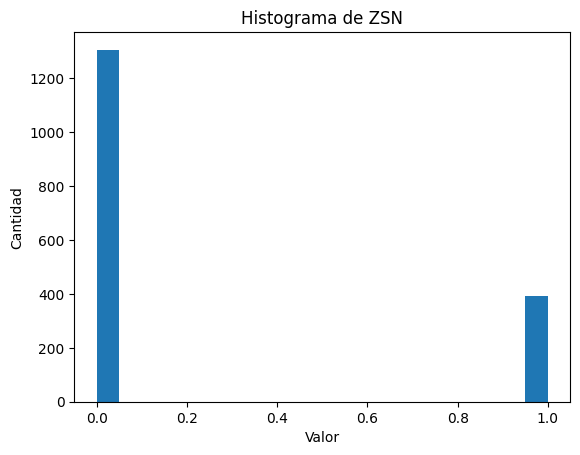

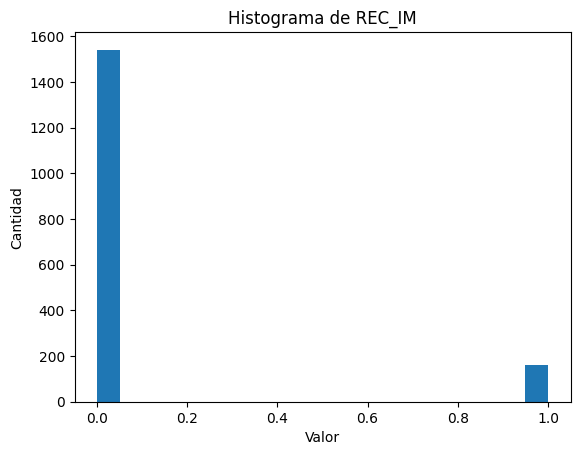

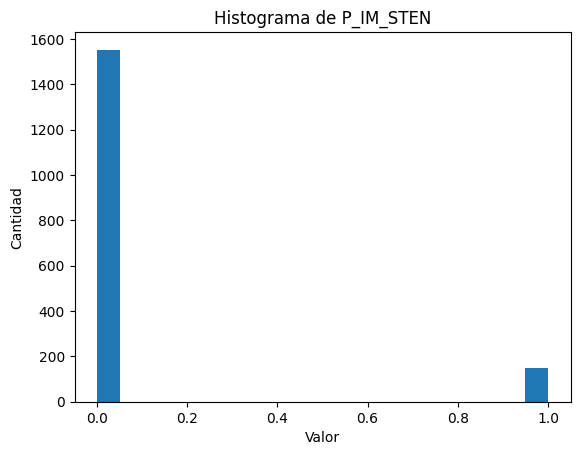

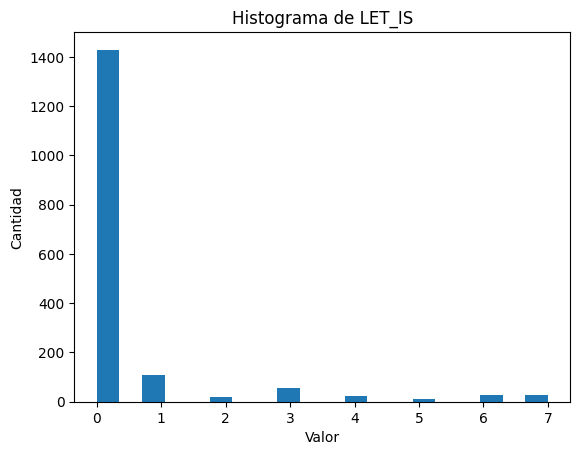

In [ ]:
# manipulación y visualización
import matplotlib.pyplot as plt
import numpy as np
import itertools
import seaborn as sns

#Para poder visualizar de forma rápida como se agrupan los datos, vamos a realizar un histograma por cada columna:
num_cols = df.select_dtypes(include=np.number).columns
for col in num_cols:
    plt.hist(df[col], bins=20)
    plt.xlabel('Valor')
    plt.ylabel('Cantidad')
    plt.title(f'Histograma de {col}')
    plt.show()

In [ ]:
df

,ID,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,1,77.0,1,2.0,1.0,1.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,3,52.0,1,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4,68.0,0,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,1,0,0,0
4,5,60.0,1,0.0,0.0,0.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,1696,77.0,0,0.0,4.0,2.0,1.0,NaN,2.0,0.0,...,0,0,1,0,1,0,0,0,0,3
1696,1697,70.0,0,0.0,6.0,2.0,1.0,NaN,2.0,0.0,...,0,0,0,0,0,0,0,0,0,1
1697,1698,55.0,1,3.0,6.0,2.0,2.0,NaN,0.0,0.0,...,0,0,0,0,0,0,0,1,0,6
1698,1699,79.0,0,2.0,2.0,2.0,1.0,NaN,2.0,0.0,...,0,0,0,1,0,0,0,0,0,1


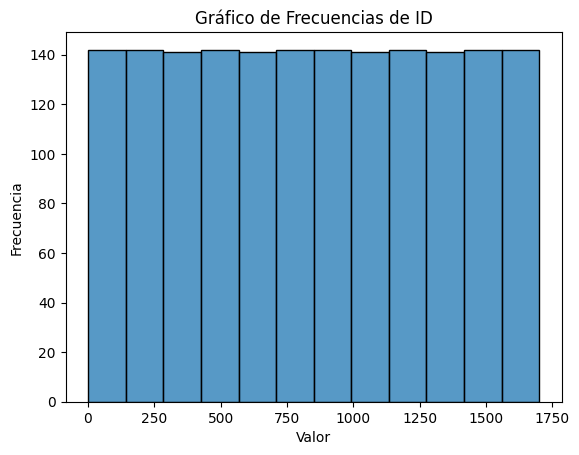

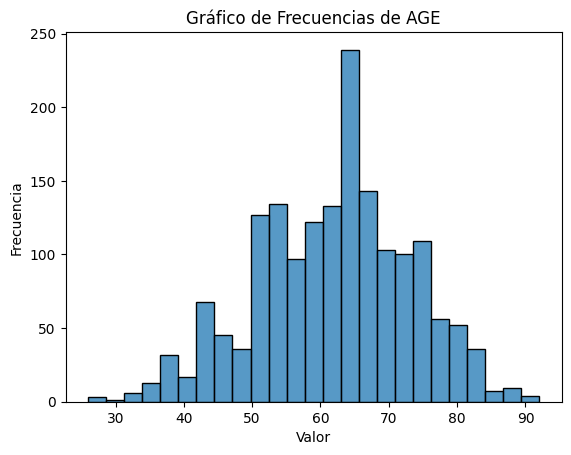

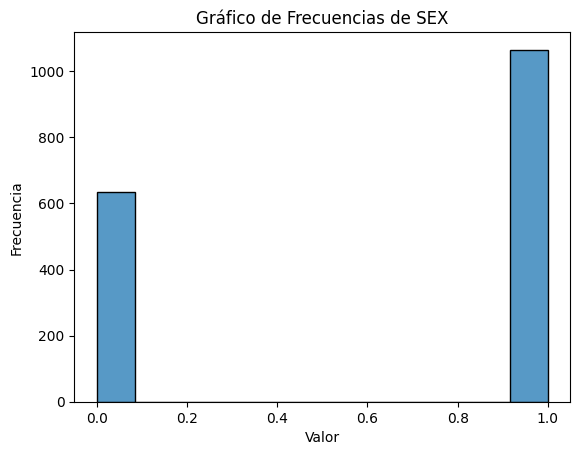

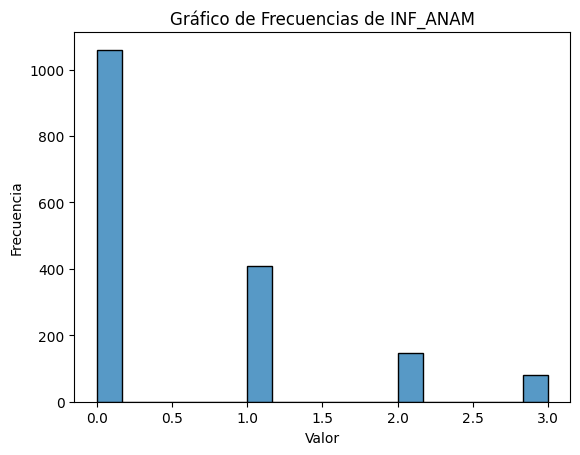

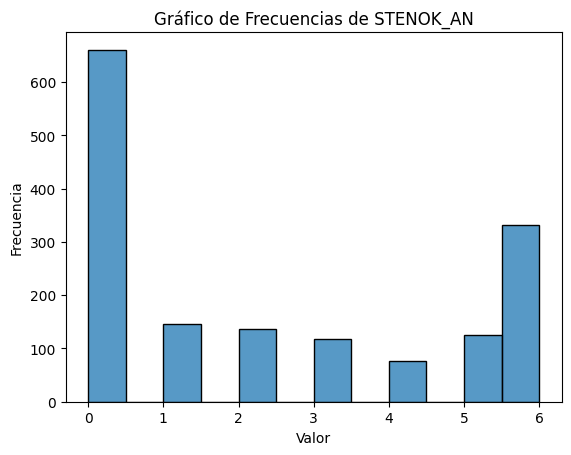

...

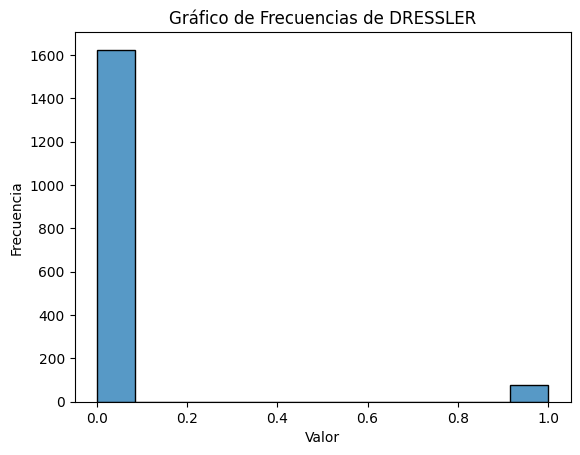

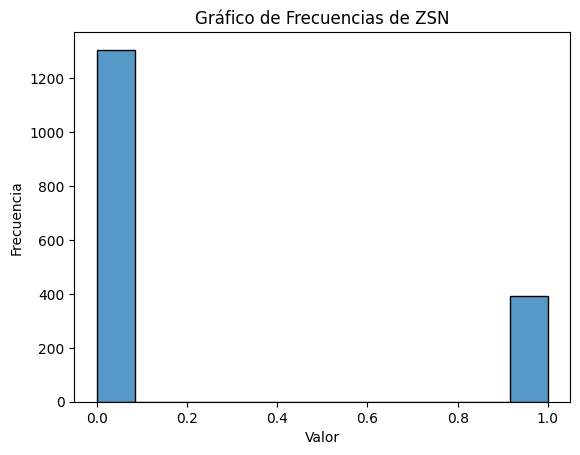

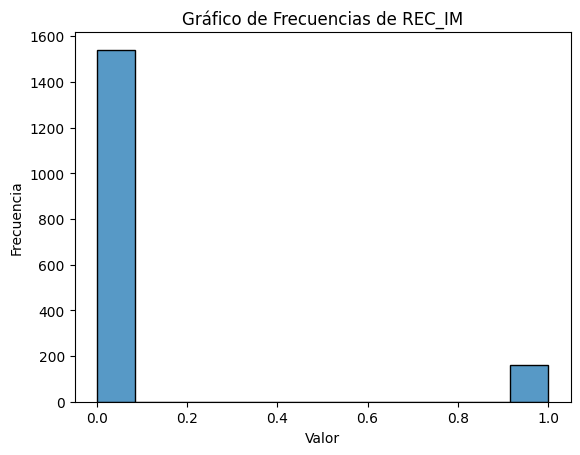

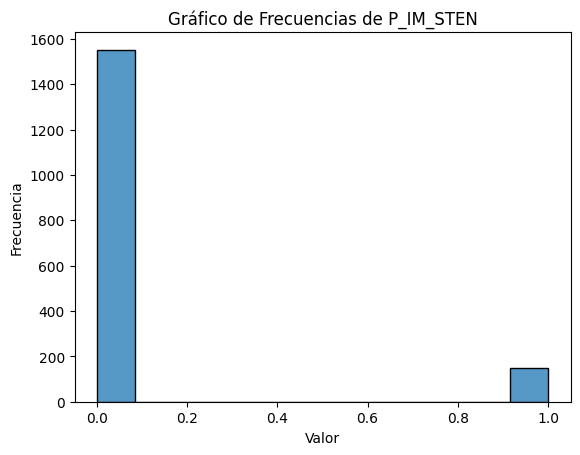

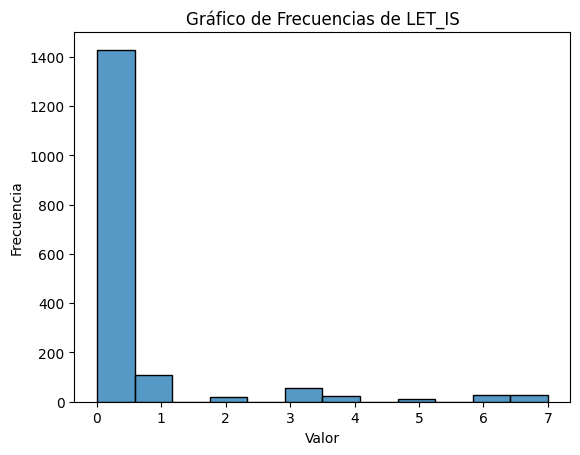

In [ ]:
# # manipulación y visualización
# import matplotlib.pyplot as plt
# import numpy as np
# import itertools
# import seaborn as sns

# #Para poder visualizar de forma rápida como se agrupan los datos, vamos a realizar un histograma por cada columna:
# num_cols = df.select_dtypes(include=np.number).columns
# for col in num_cols:
#     plt.hist(df[col], bins=20)
#     plt.xlabel('Valor')
#     plt.ylabel('Cantidad')
#     plt.title(f'Histograma de {col}')
#     plt.show()

# Importar librerías
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Seleccionar las columnas numéricas
num_cols = df.select_dtypes(include=np.number).columns

# Iterar a través de las columnas numéricas y crear gráficos de barras de frecuencia
for i, col in enumerate(num_cols):
    sns.histplot(df[col], kde=False)
    plt.xlabel('Valor')
    plt.ylabel('Frecuencia')
    plt.title(f'Gráfico de Frecuencias de {col}')
    plt.show()

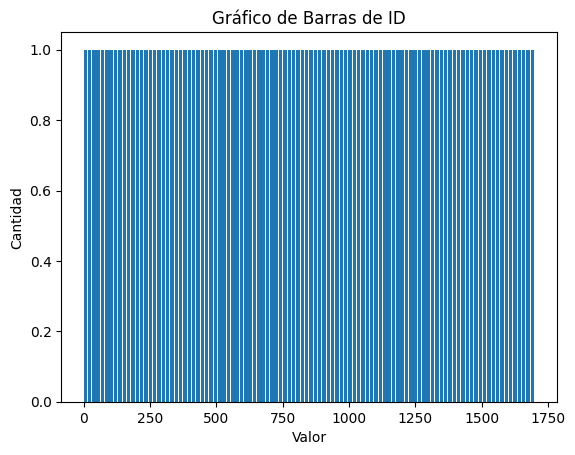

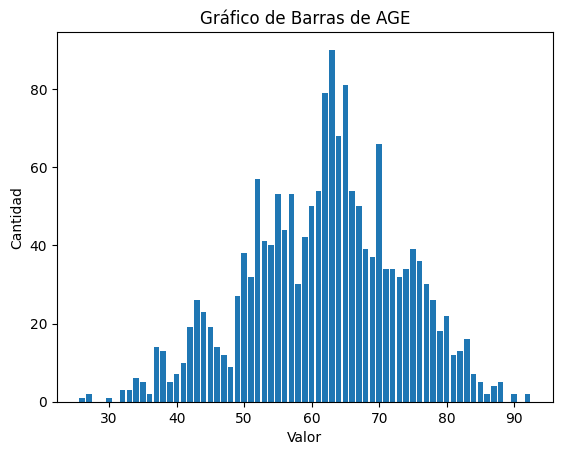

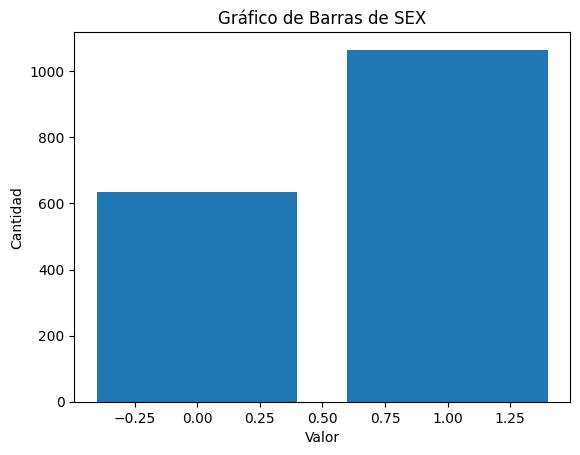

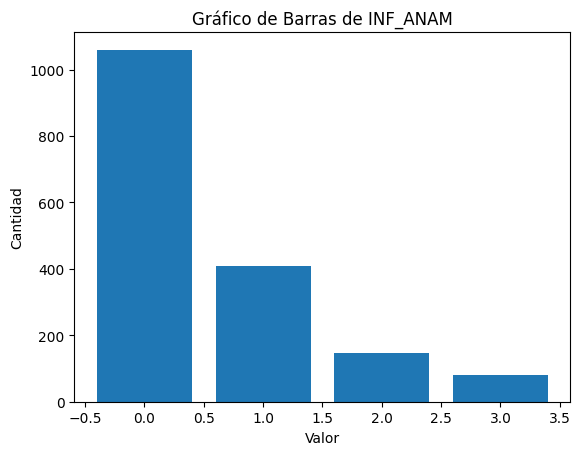

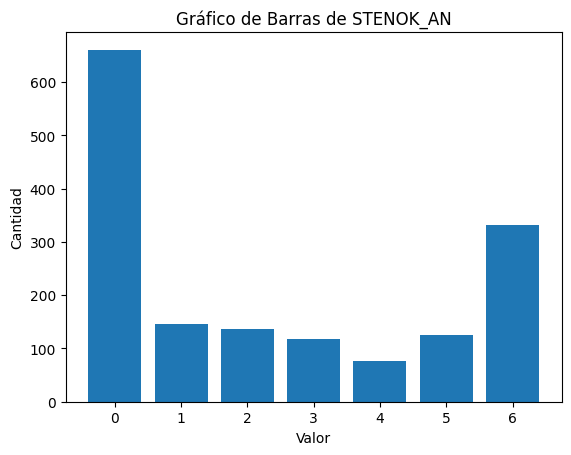

...

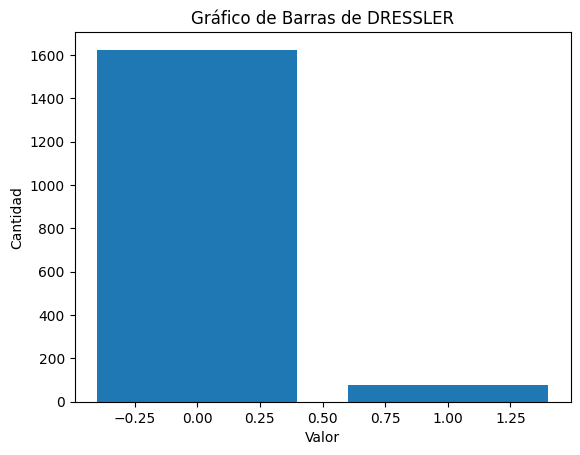

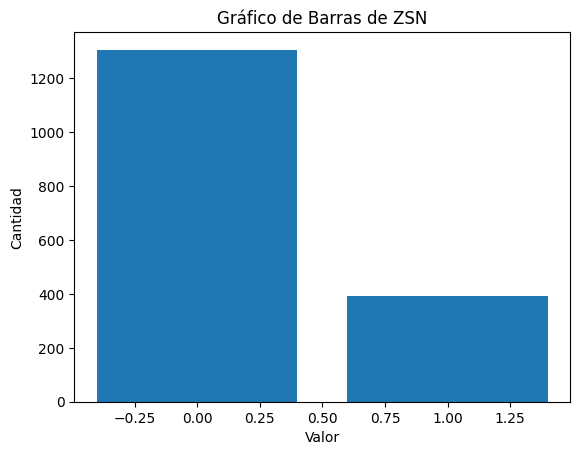

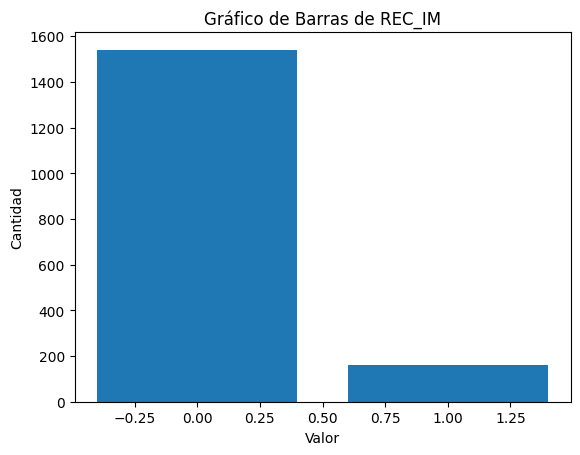

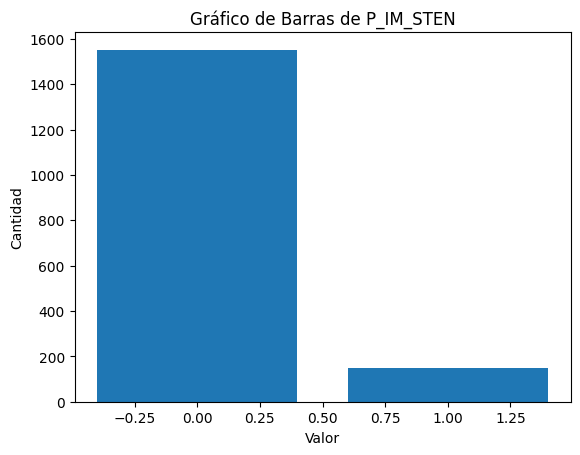

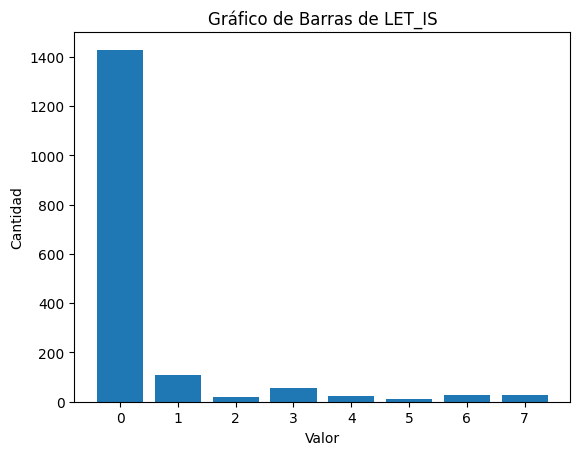

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Supongamos que tienes un DataFrame llamado df con las columnas de interés

# Para cada columna numérica en el DataFrame
num_cols = df.select_dtypes(include=np.number).columns
for col in num_cols:
    # Calcular la frecuencia de cada valor
    value_counts = df[col].value_counts()

    # Crear un gráfico de barras
    plt.bar(value_counts.index, value_counts.values)

    # Etiquetas y título
    plt.xlabel('Valor')
    plt.ylabel('Cantidad')
    plt.title(f'Gráfico de Barras de {col}')

    # Mostrar el gráfico
    plt.show()

# Nueva sección

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


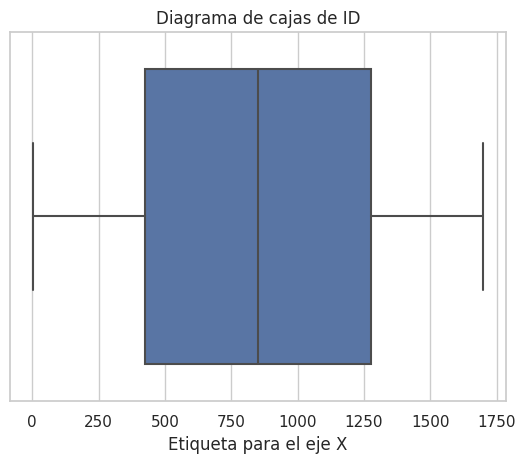

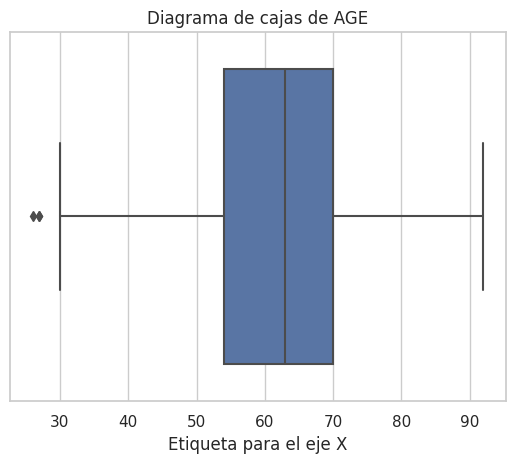

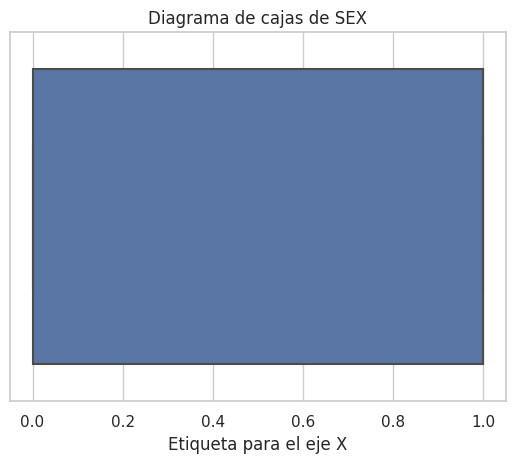

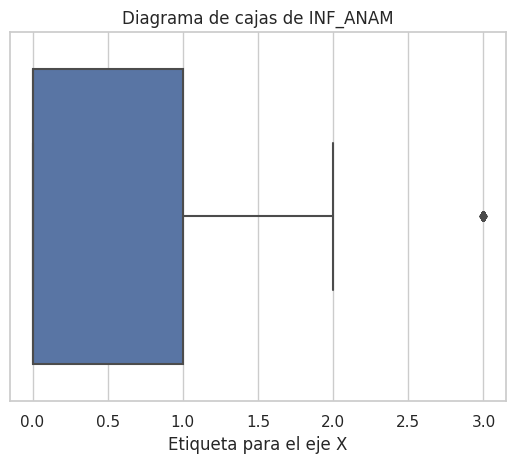

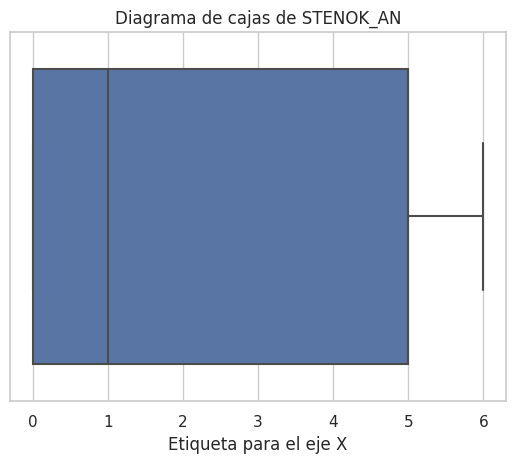

...

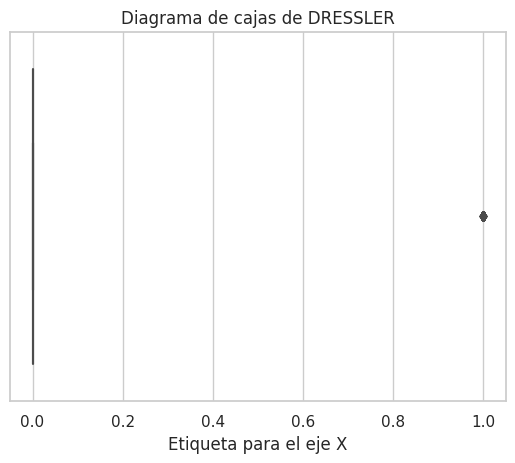

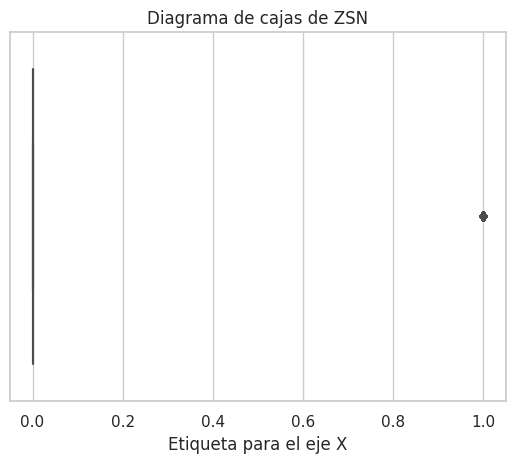

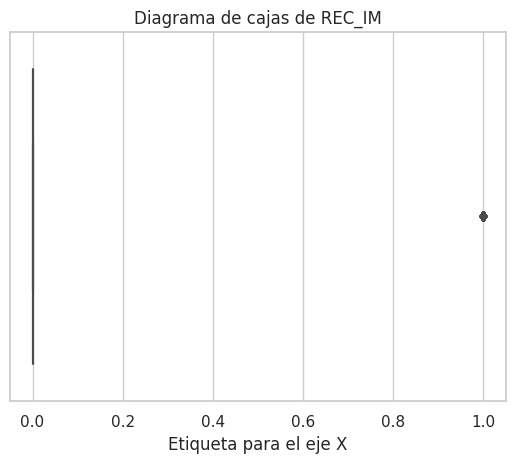

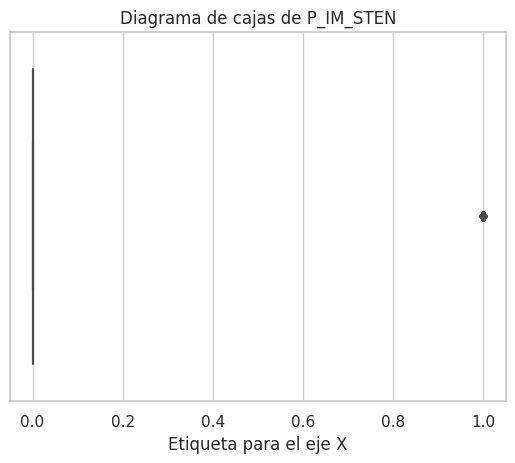

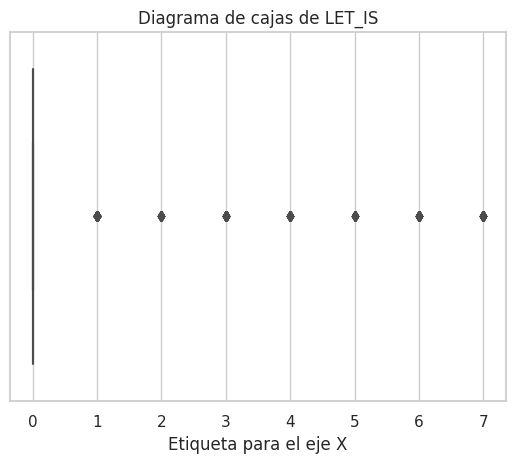

In [ ]:

for col in num_cols:
    sns.boxplot(x=col, data=df)
    plt.xlabel('Etiqueta para el eje X')
    plt.title(f'Diagrama de cajas de {col}')
    plt.show()

LIMPIEZA

In [ ]:
columns_to_drop = ["R_AB_1_n","R_AB_2_n","R_AB_3_n","NA_R_1_n","NA_R_2_n","NA_R_3_n","NOT_NA_1_n","NOT_NA_2_n","NOT_NA_3_n"]
df = df.drop(columns=columns_to_drop)

In [ ]:
X = df.iloc[:, 1:-12] # input
y = df.iloc[:, -12:]# target
y['LET_IS'] = y['LET_IS'].apply(lambda x: 1 if x > 1 else x)

In [ ]:
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Crear un objeto IterativeImputer para realizar la imputación múltiple
imputer = IterativeImputer(max_iter=20, random_state=0)

# Realizar la imputación múltiple
imputer.fit(X_train)
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [ ]:
!pip install lazypredict

In [ ]:
y

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1695,0,0,0,0,1,0,1,0,0,0,0,1
1696,0,0,0,0,0,0,0,0,0,0,0,1
1697,0,0,0,0,0,0,0,0,0,1,0,1
1698,0,0,0,0,0,1,0,0,0,0,0,1


# LAZY

In [ ]:
#FIBR_PREDS	= 0
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 0], y_test.iloc[:, 0])
models

100%|██████████| 29/29 [00:04<00:00,  6.76it/s]

[LightGBM] [Info] Number of positive: 122, number of negative: 1238
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.089706 -> initscore=-2.317231
[LightGBM] [Info] Start training from score -2.317231


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.76,0.63,0.63,0.78,0.02
Perceptron,0.83,0.59,0.59,0.82,0.02
SGDClassifier,0.84,0.58,0.58,0.82,0.07
LinearDiscriminantAnalysis,0.86,0.58,0.58,0.83,0.06
BernoulliNB,0.81,0.58,0.58,0.80,0.02
ExtraTreeClassifier,0.81,0.56,0.56,0.80,0.03
PassiveAggressiveClassifier,0.78,0.55,0.55,0.78,0.02
AdaBoostClassifier,0.86,0.54,0.54,0.82,0.21
LGBMClassifier,0.86,0.54,0.54,0.82,0.19


In [ ]:
#PREDS_TAH = 1
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 1], y_test.iloc[:, 1])
models

100%|██████████| 29/29 [00:03<00:00,  8.87it/s]

[LightGBM] [Info] Number of positive: 18, number of negative: 1342
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.013235 -> initscore=-4.311545
[LightGBM] [Info] Start training from score -4.311545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.99,0.50,0.50,0.99,0.21
XGBClassifier,0.99,0.50,0.50,0.99,0.31
CalibratedClassifierCV,0.99,0.50,0.50,0.99,0.49
SVC,0.99,0.50,0.50,0.99,0.08
DummyClassifier,0.99,0.50,0.50,0.99,0.02
ExtraTreesClassifier,0.99,0.50,0.50,0.99,0.21
RandomForestClassifier,0.99,0.50,0.50,0.99,0.33
LabelPropagation,0.99,0.50,0.50,0.99,0.10
LabelSpreading,0.99,0.50,0.50,0.99,0.19


In [ ]:
#JELUD_TAH = 2
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 2], y_test.iloc[:, 2])
models

100%|██████████| 29/29 [00:02<00:00, 10.89it/s]

[LightGBM] [Info] Number of positive: 34, number of negative: 1326
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.025000 -> initscore=-3.663562
[LightGBM] [Info] Start training from score -3.663562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.85,0.56,0.56,0.90,0.02
PassiveAggressiveClassifier,0.96,0.55,0.55,0.96,0.02
BernoulliNB,0.95,0.55,0.55,0.95,0.02
KNeighborsClassifier,0.98,0.50,0.50,0.96,0.03
RandomForestClassifier,0.98,0.50,0.50,0.96,0.27
BaggingClassifier,0.98,0.50,0.50,0.96,0.16
RidgeClassifier,0.98,0.50,0.50,0.96,0.02
LGBMClassifier,0.98,0.50,0.50,0.96,0.19
ExtraTreesClassifier,0.98,0.50,0.50,0.96,0.17


In [ ]:
#FIBR_JELUD	= 3
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 3], y_test.iloc[:, 3])
models

100%|██████████| 29/29 [00:03<00:00,  9.24it/s]


[LightGBM] [Info] Number of positive: 58, number of negative: 1302
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.042647 -> initscore=-3.111214
[LightGBM] [Info] Start training from score -3.111214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.73,0.71,0.71,0.81,0.02
BernoulliNB,0.88,0.68,0.68,0.91,0.02
ExtraTreeClassifier,0.94,0.56,0.56,0.94,0.02
DecisionTreeClassifier,0.93,0.56,0.56,0.93,0.05
LogisticRegression,0.96,0.54,0.54,0.95,0.03
AdaBoostClassifier,0.94,0.53,0.53,0.94,0.27
LinearDiscriminantAnalysis,0.93,0.52,0.52,0.93,0.06
XGBClassifier,0.96,0.50,0.50,0.94,0.40
SVC,0.96,0.50,0.50,0.94,0.11


In [ ]:
#A_V_BLOK	= 4
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 4], y_test.iloc[:, 4])
models

100%|██████████| 29/29 [00:02<00:00, 10.71it/s]

[LightGBM] [Info] Number of positive: 46, number of negative: 1314
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.033824 -> initscore=-3.352190
[LightGBM] [Info] Start training from score -3.352190
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.89,0.68,0.68,0.91,0.02
BernoulliNB,0.93,0.61,0.61,0.94,0.02
DecisionTreeClassifier,0.94,0.57,0.57,0.94,0.04
ExtraTreeClassifier,0.93,0.57,0.57,0.94,0.02
LinearDiscriminantAnalysis,0.94,0.53,0.53,0.94,0.04
LGBMClassifier,0.97,0.50,0.50,0.95,0.20
RandomForestClassifier,0.97,0.50,0.50,0.95,0.27
CalibratedClassifierCV,0.97,0.50,0.50,0.95,0.41
DummyClassifier,0.97,0.50,0.50,0.95,0.01


In [ ]:
#OTEK_LANC = 5
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 5], y_test.iloc[:, 5])
models

100%|██████████| 29/29 [00:05<00:00,  5.09it/s]

[LightGBM] [Info] Number of positive: 126, number of negative: 1234
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.092647 -> initscore=-2.281734
[LightGBM] [Info] Start training from score -2.281734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.72,0.65,0.65,0.77,0.02
LinearDiscriminantAnalysis,0.86,0.63,0.63,0.87,0.05
Perceptron,0.81,0.63,0.63,0.83,0.03
SGDClassifier,0.83,0.61,0.61,0.84,0.10
BernoulliNB,0.82,0.60,0.60,0.83,0.02
PassiveAggressiveClassifier,0.86,0.57,0.57,0.86,0.04
LogisticRegression,0.87,0.56,0.56,0.86,0.07
LinearSVC,0.89,0.56,0.56,0.87,0.39
XGBClassifier,0.90,0.55,0.55,0.87,1.94


In [ ]:
#RAZRIV = 6
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 6], y_test.iloc[:, 6])
models

100%|██████████| 29/29 [00:02<00:00, 10.51it/s]

[LightGBM] [Info] Number of positive: 42, number of negative: 1318
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.030882 -> initscore=-3.446201
[LightGBM] [Info] Start training from score -3.446201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.81,0.70,0.70,0.87,0.02
SGDClassifier,0.95,0.65,0.65,0.95,0.08
Perceptron,0.96,0.62,0.62,0.95,0.02
PassiveAggressiveClassifier,0.91,0.59,0.59,0.93,0.02
AdaBoostClassifier,0.96,0.58,0.58,0.95,0.21
BernoulliNB,0.94,0.57,0.57,0.94,0.02
ExtraTreeClassifier,0.95,0.53,0.53,0.94,0.02
GaussianNB,0.33,0.53,0.53,0.46,0.01
DecisionTreeClassifier,0.94,0.52,0.52,0.94,0.04


In [ ]:
#DRESSLER = 7
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 7], y_test.iloc[:, 7])
models

100%|██████████| 29/29 [00:03<00:00,  8.71it/s]

[LightGBM] [Info] Number of positive: 54, number of negative: 1306
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.039706 -> initscore=-3.185740
[LightGBM] [Info] Start training from score -3.185740


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.74,0.66,0.66,0.80,0.02
DecisionTreeClassifier,0.92,0.56,0.56,0.91,0.05
GaussianNB,0.37,0.55,0.55,0.48,0.01
BernoulliNB,0.92,0.54,0.54,0.91,0.02
LogisticRegression,0.94,0.52,0.52,0.92,0.03
BaggingClassifier,0.94,0.52,0.52,0.91,0.18
Perceptron,0.89,0.52,0.52,0.89,0.02
LinearDiscriminantAnalysis,0.93,0.52,0.52,0.91,0.06
SGDClassifier,0.93,0.52,0.52,0.91,0.07


In [ ]:
#ZSN = 8
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 8], y_test.iloc[:, 8])
models

100%|██████████| 29/29 [00:04<00:00,  6.81it/s]

[LightGBM] [Info] Number of positive: 315, number of negative: 1045
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.231618 -> initscore=-1.199200
[LightGBM] [Info] Start training from score -1.199200


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.82,0.67,0.67,0.80,0.53
LGBMClassifier,0.81,0.66,0.66,0.79,0.19
BaggingClassifier,0.81,0.65,0.65,0.79,0.21
AdaBoostClassifier,0.78,0.63,0.63,0.76,0.21
DecisionTreeClassifier,0.72,0.62,0.62,0.72,0.05
BernoulliNB,0.75,0.60,0.60,0.73,0.02
NearestCentroid,0.64,0.60,0.60,0.66,0.02
PassiveAggressiveClassifier,0.67,0.60,0.60,0.69,0.02
ExtraTreeClassifier,0.71,0.59,0.59,0.71,0.02


In [ ]:
#REC_IM	 = 9
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 9], y_test.iloc[:, 9])
models

100%|██████████| 29/29 [00:04<00:00,  5.92it/s]

[LightGBM] [Info] Number of positive: 128, number of negative: 1232
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.094118 -> initscore=-2.264364
[LightGBM] [Info] Start training from score -2.264364


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.66,0.65,0.65,0.73,0.02
DecisionTreeClassifier,0.84,0.58,0.58,0.85,0.12
SGDClassifier,0.84,0.56,0.56,0.84,0.07
PassiveAggressiveClassifier,0.81,0.55,0.55,0.83,0.02
Perceptron,0.83,0.53,0.53,0.83,0.02
AdaBoostClassifier,0.89,0.52,0.52,0.87,0.35
XGBClassifier,0.91,0.52,0.52,0.87,0.49
ExtraTreeClassifier,0.83,0.52,0.52,0.84,0.02
QuadraticDiscriminantAnalysis,0.35,0.51,0.51,0.44,0.03


In [ ]:
#P_IM_STEN	= 10
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 10], y_test.iloc[:, 10])
models

100%|██████████| 29/29 [00:04<00:00,  6.70it/s]

[LightGBM] [Info] Number of positive: 113, number of negative: 1247
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.083088 -> initscore=-2.401108
[LightGBM] [Info] Start training from score -2.401108


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LabelSpreading,0.85,0.56,0.56,0.84,0.20
LabelPropagation,0.85,0.56,0.56,0.84,0.18
NearestCentroid,0.62,0.55,0.55,0.69,0.02
LGBMClassifier,0.90,0.54,0.54,0.87,0.21
GaussianNB,0.30,0.53,0.53,0.36,0.02
ExtraTreesClassifier,0.90,0.53,0.53,0.86,0.28
XGBClassifier,0.90,0.53,0.53,0.86,0.49
QuadraticDiscriminantAnalysis,0.44,0.53,0.53,0.54,0.03
LogisticRegression,0.89,0.52,0.52,0.85,0.03


In [ ]:
#LET_IS	= 11
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train.iloc[:, 11], y_test.iloc[:, 11])
models

100%|██████████| 29/29 [00:04<00:00,  6.44it/s]

[LightGBM] [Info] Number of positive: 216, number of negative: 1144
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4778
[LightGBM] [Info] Number of data points in the train set: 1360, number of used features: 81
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.158824 -> initscore=-1.667008
[LightGBM] [Info] Start training from score -1.667008


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
AdaBoostClassifier,0.90,0.73,0.73,0.89,0.22
LGBMClassifier,0.91,0.72,0.72,0.89,0.19
XGBClassifier,0.90,0.72,0.72,0.88,1.34
NearestCentroid,0.81,0.71,0.71,0.82,0.02
BernoulliNB,0.84,0.70,0.70,0.84,0.02
Perceptron,0.86,0.70,0.70,0.85,0.02
DecisionTreeClassifier,0.84,0.69,0.69,0.84,0.05
SGDClassifier,0.84,0.68,0.68,0.83,0.08
LinearSVC,0.86,0.68,0.68,0.85,0.25


# PRED (SCALLER + SMOOTH, TODAS CARACTERISTICAS)

In [ ]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import Perceptron
from sklearn.neighbors import NearestCentroid

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

# models = {
#     'LogisticRegression': LogisticRegression(max_iter=3000),
#     'XGBoostClassifier': XGBClassifier(colsample_bytree= 0.9, learning_rate= 0.01, max_depth= 4, n_estimators= 300, subsample= 0.8),
#     "ExtraTreesClassifier": ExtraTreesClassifier(max_depth= 20, max_features= 10, min_samples_leaf= 1, min_samples_split=5, n_estimators=100),
# }

models = {
    'LogisticRegression': LogisticRegression(),
    'XGBoostClassifier': XGBClassifier(),
    "ExtraTreesClassifier": ExtraTreesClassifier(),
    "NearestCentroid": NearestCentroid(),
    "Perceptron": Perceptron(),
    "BernoulliNB": BernoulliNB()
}

In [ ]:
#SCALLER
# Realizar la imputación múltiple
# imputer.fit(X_train)
# X_train = imputer.transform(X_train)
# X_test = imputer.transform(X_test)

# X_resampled = sklearn.preprocessing.StandardScaler().fit_transform(X_resampled)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

# Paso 2: Transformar (transform) los datos de entrenamiento y prueba
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, f1_score, balanced_accuracy_score

acc = []
specificities = []
sensitivities = []
precisions = []
f1_scores = []
balanced_accuracies = []

for model_name, model in models.items():
    clf = model
    acc_model = []
    specificity_model = []
    sensitivity_model = []
    precision_model = []
    f1_score_model = []
    balanced_accuracy_model = []
    for i in range(0, 12):

        #SMOTE
        smote = SMOTE(sampling_strategy='auto', random_state=123)
        X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train.iloc[:, i])

        clf.fit(X_resampled, y_resampled)

        y_pred = clf.predict(X_test_scaled)

        # Accuracy
        acc_feature = round(clf.score(X_test_scaled, y_test.iloc[:, i]) * 100, 5)
        acc_model.append(acc_feature)

        # Calculate the confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test.iloc[:, i], y_pred).ravel()

        # Calculate specificity, sensitivity, and precision
        specificity = tn / (tn + fp)
        sensitivity = tp / (tp + fn)
        precision = tp / (tp + fp)

        specificity_model.append(specificity)
        sensitivity_model.append(sensitivity)
        precision_model.append(precision)

        # Calculate F1 Score and Balanced Accuracy
        f1 = f1_score(y_test.iloc[:, i], y_pred)
        balanced_acc = balanced_accuracy_score(y_test.iloc[:, i], y_pred)

        f1_score_model.append(f1)
        balanced_accuracy_model.append(balanced_acc)

    acc.append(acc_model)
    specificities.append(specificity_model)
    sensitivities.append(sensitivity_model)
    precisions.append(precision_model)
    f1_scores.append(f1_score_model)
    balanced_accuracies.append(balanced_accuracy_model)

In [ ]:
acc_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(acc)):
    acc_df.iloc[i] = acc[i]
acc_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,73.53,87.65,89.71,79.71,84.71,71.18,89.12,75.88,60.00,62.65,68.24,83.24
XGBoostClassifier,86.18,99.41,97.35,94.12,96.18,87.06,95.29,93.24,77.35,90.00,88.24,92.06
ExtraTreesClassifier,84.71,99.41,97.65,95.59,96.76,89.41,96.47,93.82,75.88,90.00,89.12,86.18
NearestCentroid,71.47,95.00,82.65,71.76,86.47,67.06,75.29,70.00,62.06,62.94,63.53,81.18
Perceptron,67.94,90.00,89.41,77.06,85.29,66.47,85.88,73.82,60.88,60.59,63.24,81.18
BernoulliNB,69.71,86.18,84.41,75.88,82.65,72.35,81.47,67.06,68.53,70.59,72.65,79.12


In [ ]:
specificities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(specificities)):
    specificities_df.iloc[i] = specificities[i]
specificities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.78,0.88,0.91,0.82,0.87,0.73,0.91,0.78,0.61,0.64,0.71,0.87
XGBoostClassifier,0.98,1.00,1.00,0.97,0.99,0.95,0.98,0.99,0.88,0.98,0.97,0.98
ExtraTreesClassifier,0.99,1.00,1.00,0.99,1.00,0.97,1.00,1.00,0.95,0.99,0.98,0.97
NearestCentroid,0.76,0.96,0.84,0.72,0.88,0.68,0.77,0.70,0.66,0.63,0.66,0.84
Perceptron,0.72,0.91,0.91,0.79,0.88,0.67,0.88,0.76,0.62,0.61,0.65,0.85
BernoulliNB,0.74,0.87,0.86,0.76,0.84,0.75,0.83,0.67,0.71,0.73,0.75,0.82


In [ ]:
sensitivities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(sensitivities)):
    sensitivities_df.iloc[i] = sensitivities[i]
sensitivities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.44,0.00,0.25,0.31,0.27,0.58,0.42,0.48,0.56,0.45,0.43,0.64
XGBoostClassifier,0.15,0.00,0.00,0.15,0.00,0.12,0.17,0.00,0.42,0.06,0.09,0.64
ExtraTreesClassifier,0.00,0.00,0.00,0.08,0.00,0.15,0.00,0.05,0.14,0.03,0.09,0.29
NearestCentroid,0.46,0.00,0.25,0.69,0.55,0.61,0.42,0.67,0.51,0.58,0.46,0.67
Perceptron,0.44,0.00,0.12,0.31,0.18,0.61,0.33,0.43,0.56,0.58,0.51,0.60
BernoulliNB,0.44,0.00,0.38,0.69,0.27,0.52,0.50,0.67,0.61,0.48,0.51,0.65


In [ ]:
precisions_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(precisions)):
    precisions_df.iloc[i] = precisions[i]
precisions_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.25,0.00,0.06,0.06,0.06,0.18,0.14,0.12,0.30,0.11,0.15,0.49
XGBoostClassifier,0.54,NaN,0.00,0.18,0.00,0.21,0.25,0.00,0.52,0.29,0.27,0.83
ExtraTreesClassifier,0.00,NaN,NaN,0.25,NaN,0.38,NaN,0.50,0.44,0.20,0.38,0.67
NearestCentroid,0.24,0.00,0.04,0.09,0.13,0.17,0.06,0.13,0.31,0.14,0.13,0.45
Perceptron,0.20,0.00,0.03,0.05,0.05,0.17,0.09,0.10,0.31,0.13,0.14,0.44
BernoulliNB,0.22,0.00,0.06,0.10,0.06,0.18,0.10,0.12,0.39,0.15,0.19,0.41


In [ ]:
f1_scores_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(f1_scores)):
    f1_scores_df.iloc[i] = f1_scores[i]
f1_scores_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.32,0.00,0.10,0.10,0.10,0.28,0.21,0.20,0.39,0.18,0.22,0.55
XGBoostClassifier,0.23,0.00,0.00,0.17,0.00,0.15,0.20,0.00,0.46,0.11,0.13,0.72
ExtraTreesClassifier,0.00,0.00,0.00,0.12,0.00,0.22,0.00,0.09,0.21,0.06,0.14,0.41
NearestCentroid,0.31,0.00,0.06,0.16,0.21,0.26,0.11,0.22,0.38,0.22,0.21,0.54
Perceptron,0.28,0.00,0.05,0.09,0.07,0.26,0.14,0.17,0.40,0.21,0.22,0.51
BernoulliNB,0.29,0.00,0.10,0.18,0.09,0.27,0.16,0.20,0.47,0.23,0.28,0.50


In [ ]:
balanced_accuracies_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(balanced_accuracies)):
    balanced_accuracies_df.iloc[i] = balanced_accuracies[i]
balanced_accuracies_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.61,0.44,0.58,0.56,0.57,0.65,0.66,0.63,0.58,0.55,0.57,0.75
XGBoostClassifier,0.56,0.50,0.50,0.56,0.50,0.54,0.57,0.50,0.65,0.52,0.53,0.81
ExtraTreesClassifier,0.49,0.50,0.50,0.53,0.50,0.56,0.50,0.52,0.54,0.51,0.53,0.63
NearestCentroid,0.61,0.48,0.55,0.71,0.71,0.64,0.59,0.68,0.58,0.61,0.56,0.76
Perceptron,0.58,0.45,0.52,0.55,0.53,0.64,0.61,0.59,0.59,0.59,0.58,0.73
BernoulliNB,0.59,0.43,0.62,0.73,0.56,0.63,0.66,0.67,0.66,0.61,0.63,0.74


# PRED SIN SCALLER (CON SCALLER MEJOR)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, f1_score, balanced_accuracy_score

acc = []
specificities = []
sensitivities = []
precisions = []
f1_scores = []
balanced_accuracies = []

for model_name, model in models.items():
    clf = model
    acc_model = []
    specificity_model = []
    sensitivity_model = []
    precision_model = []
    f1_score_model = []
    balanced_accuracy_model = []
    for i in range(0, 12):

        #SMOTE
        smote = SMOTE(sampling_strategy='auto', random_state=123)
        X_resampled, y_resampled = smote.fit_resample(X_train, y_train.iloc[:, i])

        clf.fit(X_resampled, y_resampled)

        y_pred = clf.predict(X_test)

        # Accuracy
        acc_feature = round(clf.score(X_test, y_test.iloc[:, i]) * 100, 5)
        acc_model.append(acc_feature)

        # Calculate the confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test.iloc[:, i], y_pred).ravel()

        # Calculate specificity, sensitivity, and precision
        specificity = tn / (tn + fp)
        sensitivity = tp / (tp + fn)
        precision = tp / (tp + fp)

        specificity_model.append(specificity)
        sensitivity_model.append(sensitivity)
        precision_model.append(precision)

        # Calculate F1 Score and Balanced Accuracy
        f1 = f1_score(y_test.iloc[:, i], y_pred)
        balanced_acc = balanced_accuracy_score(y_test.iloc[:, i], y_pred)

        f1_score_model.append(f1)
        balanced_accuracy_model.append(balanced_acc)

    acc.append(acc_model)
    specificities.append(specificity_model)
    sensitivities.append(sensitivity_model)
    precisions.append(precision_model)
    f1_scores.append(f1_score_model)
    balanced_accuracies.append(balanced_accuracy_model)

In [ ]:
acc_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(acc)):
    acc_df.iloc[i] = acc[i]
acc_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,67.35,82.94,82.94,69.41,82.94,69.71,81.18,67.94,66.47,59.71,59.41,82.06
XGBoostClassifier,85.59,99.41,97.06,95.00,96.47,87.65,95.88,93.82,78.24,89.12,89.12,89.71
ExtraTreesClassifier,86.18,99.41,97.65,95.59,96.76,89.71,96.47,94.12,77.06,90.29,89.41,86.47
NearestCentroid,55.59,56.18,59.71,57.94,55.29,60.88,62.94,56.76,57.35,55.59,60.59,68.24
Perceptron,22.65,88.53,69.71,3.82,58.82,10.59,70.00,12.94,76.76,9.12,14.12,82.35
BernoulliNB,79.41,91.76,88.53,86.47,84.12,84.41,85.59,82.65,71.18,82.06,81.47,81.18


In [ ]:
f1_scores_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(f1_scores)):
    f1_scores_df.iloc[i] = f1_scores[i]
f1_scores_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.34,0.00,0.09,0.17,0.12,0.28,0.24,0.13,0.47,0.20,0.19,0.53
XGBoostClassifier,0.22,0.00,0.00,0.19,0.00,0.22,0.12,0.09,0.45,0.14,0.14,0.62
ExtraTreesClassifier,0.11,0.00,0.00,0.00,0.00,0.19,0.00,0.09,0.25,0.00,0.10,0.39
NearestCentroid,0.21,0.00,0.04,0.15,0.08,0.19,0.10,0.17,0.37,0.18,0.14,0.38
Perceptron,0.25,0.00,0.10,0.07,0.11,0.18,0.15,0.11,0.00,0.17,0.19,0.55
BernoulliNB,0.20,0.00,0.05,0.12,0.13,0.29,0.00,0.12,0.27,0.09,0.03,0.38


In [ ]:
balanced_accuracies_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(balanced_accuracies)):
    balanced_accuracies_df.iloc[i] = balanced_accuracies[i]
balanced_accuracies_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.64,0.42,0.61,0.77,0.60,0.66,0.82,0.54,0.65,0.58,0.53,0.75
XGBoostClassifier,0.56,0.50,0.50,0.57,0.50,0.57,0.54,0.52,0.64,0.53,0.53,0.74
ExtraTreesClassifier,0.53,0.50,0.50,0.50,0.50,0.55,0.50,0.52,0.56,0.50,0.52,0.63
NearestCentroid,0.50,0.28,0.49,0.78,0.59,0.55,0.61,0.64,0.56,0.55,0.48,0.65
Perceptron,0.51,0.45,0.72,0.50,0.70,0.50,0.72,0.49,0.50,0.50,0.51,0.76
BernoulliNB,0.54,0.46,0.51,0.56,0.61,0.62,0.44,0.53,0.54,0.49,0.47,0.63


# MENOS CARACTERISTICAS

In [ ]:
df

,ID,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,1,77.00,1,2.00,1.00,1.00,2.00,NaN,3.00,0.00,...,0,0,0,0,0,0,0,0,0,0
1,2,55.00,1,1.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0,0,0,0,0,0,0,0,0,0
2,3,52.00,1,0.00,0.00,0.00,2.00,NaN,2.00,0.00,...,0,0,0,0,0,0,0,0,0,0
3,4,68.00,0,0.00,0.00,0.00,2.00,NaN,2.00,0.00,...,0,0,0,0,0,0,1,0,0,0
4,5,60.00,1,0.00,0.00,0.00,2.00,NaN,3.00,0.00,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,1696,77.00,0,0.00,4.00,2.00,1.00,NaN,2.00,0.00,...,0,0,1,0,1,0,0,0,0,3
1696,1697,70.00,0,0.00,6.00,2.00,1.00,NaN,2.00,0.00,...,0,0,0,0,0,0,0,0,0,1
1697,1698,55.00,1,3.00,6.00,2.00,2.00,NaN,0.00,0.00,...,0,0,0,0,0,0,0,1,0,6
1698,1699,79.00,0,2.00,2.00,2.00,1.00,NaN,2.00,0.00,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
X = df.iloc[:, 1:-12] # input
y = df.iloc[:, -12:]# target
y['LET_IS'] = y['LET_IS'].apply(lambda x: 1 if x > 1 else x)

In [ ]:
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Crear un objeto IterativeImputer para realizar la imputación múltiple
imputer = IterativeImputer(max_iter=20, random_state=0)

# Realizar la imputación múltiple
imputer.fit(X_train)
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Crear un clasificador de Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=0)

# Ajustar el clasificador a tus datos
clf.fit(X_train, y_train)

# Obtener importancias de características
feature_importances = clf.feature_importances_

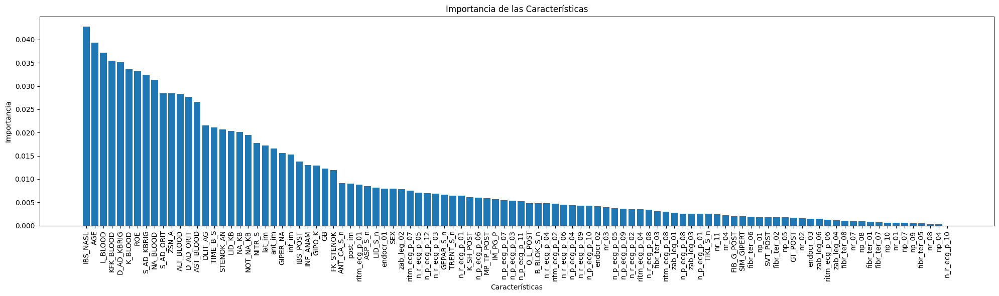

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# Obtén los nombres de las características
feature_names = X.columns  # Reemplaza X con tus datos de características

# Ordena las características por importancia en orden descendente
indices = np.argsort(feature_importances)[::-1]

# Crea un gráfico de barras para visualizar la importancia de las características
plt.figure(figsize=(20, 6))
plt.title("Importancia de las Características")
plt.bar(range(len(indices)), feature_importances[indices], align="center")
plt.xticks(range(len(indices)), [feature_names[i] for i in indices], rotation=90)
plt.xlabel("Características")
plt.ylabel("Importancia")
plt.tight_layout()
plt.show()

In [ ]:
# Crear una lista de tuplas que contengan la importancia y el índice de cada característica
feature_importance_tuples = [(importance, index) for index, importance in enumerate(feature_importances)]

# Ordena las características por importancia en orden descendente
feature_importance_tuples.sort(reverse=True)

# Selecciona las 30 características principales
top_30_features = [index for importance, index in feature_importance_tuples[:30]]

In [ ]:
#[6,0,88,87,34,82,89,33,84,35,10,85,36,86,9,90,3,93,91,92,94,44,43,83,45,5,2,81,7,4]

In [ ]:
X = df.iloc[:, 1:-12] # input
y = df.iloc[:, -12:]# target
y['LET_IS'] = y['LET_IS'].apply(lambda x: 1 if x > 1 else x)

In [ ]:
X = X.iloc[:,[6,0,88,87,34,82,89,33,84,35,10,85,36,86,9,90,3,93,91,92,94,44,43,83,45,5,2,81,7,4]]

In [ ]:
pd.set_option('display.max_columns', 100)
X

,IBS_NASL,AGE,L_BLOOD,KFK_BLOOD,D_AD_KBRIG,K_BLOOD,ROE,S_AD_KBRIG,NA_BLOOD,S_AD_ORIT,ZSN_A,ALT_BLOOD,D_AD_ORIT,AST_BLOOD,DLIT_AG,TIME_B_S,STENOK_AN,R_AB_3_n,R_AB_1_n,R_AB_2_n,NA_KB,lat_im,ant_im,GIPER_NA,inf_im,IBS_POST,INF_ANAM,GIPO_K,GB,FK_STENOK
0,NaN,77.0,8.0,NaN,NaN,4.7,16.0,NaN,138.0,180.0,0.0,NaN,100.0,NaN,7.0,4.0,1.0,1.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,2.0,2.0,0.0,3.0,1.0
1,0.0,55.0,7.8,NaN,NaN,3.5,3.0,NaN,132.0,120.0,0.0,0.38,90.0,0.18,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,NaN,52.0,10.8,NaN,100.0,4.0,NaN,150.0,132.0,180.0,0.0,0.30,100.0,0.11,2.0,3.0,0.0,0.0,3.0,0.0,1.0,1.0,4.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0
3,NaN,68.0,NaN,NaN,NaN,3.9,NaN,NaN,146.0,120.0,1.0,0.75,70.0,0.37,3.0,2.0,0.0,1.0,0.0,0.0,NaN,1.0,0.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0
4,NaN,60.0,8.3,NaN,100.0,3.5,NaN,190.0,132.0,160.0,0.0,0.45,90.0,0.22,7.0,9.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,2.0,0.0,1.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,NaN,77.0,12.8,NaN,NaN,3.7,6.0,NaN,130.0,110.0,0.0,1.05,70.0,0.52,7.0,2.0,4.0,NaN,0.0,NaN,1.0,NaN,NaN,0.0,0.0,1.0,0.0,1.0,2.0,2.0
1696,NaN,70.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.0,0.0,NaN,0.0,NaN,7.0,2.0,6.0,NaN,0.0,NaN,1.0,0.0,0.0,NaN,2.0,1.0,0.0,NaN,2.0,2.0
1697,NaN,55.0,8.3,NaN,NaN,NaN,13.0,NaN,NaN,70.0,0.0,0.23,50.0,0.15,0.0,1.0,6.0,0.0,2.0,0.0,NaN,1.0,4.0,NaN,0.0,2.0,3.0,NaN,0.0,2.0
1698,NaN,79.0,7.5,NaN,NaN,3.1,4.0,NaN,136.0,110.0,NaN,0.45,70.0,0.45,7.0,2.0,2.0,NaN,1.0,NaN,1.0,NaN,NaN,0.0,NaN,1.0,2.0,1.0,2.0,2.0


In [ ]:
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Crear un objeto IterativeImputer para realizar la imputación múltiple
imputer = IterativeImputer(max_iter=20, random_state=0)

# Realizar la imputación múltiple
imputer.fit(X_train)
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [ ]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import Perceptron
from sklearn.neighbors import NearestCentroid

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

models = {
    'LogisticRegression': LogisticRegression(),
    'XGBoostClassifier': XGBClassifier(),
    "ExtraTreesClassifier": ExtraTreesClassifier(),
    "NearestCentroid": NearestCentroid(),
    "Perceptron": Perceptron(),
    "BernoulliNB": BernoulliNB()
}

In [ ]:
#SCALLER

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

# Paso 2: Transformar (transform) los datos de entrenamiento y prueba
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, f1_score, balanced_accuracy_score

acc = []
specificities = []
sensitivities = []
precisions = []
f1_scores = []
balanced_accuracies = []

for model_name, model in models.items():
    clf = model
    acc_model = []
    specificity_model = []
    sensitivity_model = []
    precision_model = []
    f1_score_model = []
    balanced_accuracy_model = []
    for i in range(0, 12):

        #SMOTE
        smote = SMOTE(sampling_strategy='auto', random_state=123)
        X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train.iloc[:, i])

        clf.fit(X_resampled, y_resampled)

        y_pred = clf.predict(X_test_scaled)

        # Accuracy
        acc_feature = round(clf.score(X_test_scaled, y_test.iloc[:, i]) * 100, 5)
        acc_model.append(acc_feature)

        # Calculate the confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test.iloc[:, i], y_pred).ravel()

        # Calculate specificity, sensitivity, and precision
        specificity = tn / (tn + fp)
        sensitivity = tp / (tp + fn)
        precision = tp / (tp + fp)

        specificity_model.append(specificity)
        sensitivity_model.append(sensitivity)
        precision_model.append(precision)

        # Calculate F1 Score and Balanced Accuracy
        f1 = f1_score(y_test.iloc[:, i], y_pred)
        balanced_acc = balanced_accuracy_score(y_test.iloc[:, i], y_pred)

        f1_score_model.append(f1)
        balanced_accuracy_model.append(balanced_acc)

    acc.append(acc_model)
    specificities.append(specificity_model)
    sensitivities.append(sensitivity_model)
    precisions.append(precision_model)
    f1_scores.append(f1_score_model)
    balanced_accuracies.append(balanced_accuracy_model)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and

In [ ]:
acc_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(acc)):
    acc_df.iloc[i] = acc[i]
acc_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,60.88235,71.17647,71.17647,64.11765,77.94118,68.23529,80.29412,62.35294,60.58824,60.29412,61.17647,80.29412
XGBoostClassifier,76.76471,88.52941,86.47059,82.94118,84.70588,83.52941,90.58824,85.88235,78.52941,80.58824,76.47059,84.41176
NearestCentroid,53.82353,43.82353,49.41176,51.17647,55.58824,56.47059,51.17647,55.0,56.76471,52.94118,47.94118,62.35294


In [ ]:
sensitivities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(sensitivities)):
    sensitivities_df.iloc[i] = sensitivities[i]
sensitivities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.44,0.00,0.62,0.62,0.55,0.55,0.83,0.67,0.57,0.55,0.60,0.69
XGBoostClassifier,0.08,0.00,0.00,0.15,0.00,0.18,0.08,0.05,0.35,0.00,0.09,0.55
ExtraTreesClassifier,0.00,0.00,0.00,0.08,0.00,0.18,0.00,0.05,0.16,0.03,0.06,0.35
NearestCentroid,0.56,0.50,0.50,0.62,0.64,0.52,0.67,0.76,0.65,0.58,0.57,0.65
Perceptron,0.58,0.00,0.50,0.62,0.18,0.52,0.75,0.52,0.52,0.61,0.29,0.73
BernoulliNB,0.52,0.00,0.50,0.69,0.55,0.52,0.50,0.62,0.58,0.61,0.51,0.75


In [ ]:
f1_scores_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(f1_scores)):
    f1_scores_df.iloc[i] = f1_scores[i]
f1_scores_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.24,0.00,0.09,0.12,0.14,0.25,0.23,0.18,0.40,0.20,0.24,0.53
XGBoostClassifier,0.14,0.00,0.00,0.24,0.00,0.23,0.10,0.08,0.44,0.00,0.13,0.62
ExtraTreesClassifier,0.00,0.00,0.00,0.14,0.00,0.24,0.00,0.09,0.24,0.06,0.09,0.45
NearestCentroid,0.28,0.01,0.07,0.12,0.12,0.25,0.14,0.20,0.44,0.21,0.24,0.46
Perceptron,0.29,0.00,0.09,0.11,0.05,0.20,0.19,0.17,0.32,0.17,0.13,0.48
BernoulliNB,0.27,0.00,0.07,0.12,0.09,0.23,0.13,0.16,0.43,0.23,0.23,0.45


In [ ]:
balanced_accuracies_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(balanced_accuracies)):
    balanced_accuracies_df.iloc[i] = balanced_accuracies[i]
balanced_accuracies_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.54,0.36,0.67,0.63,0.66,0.62,0.82,0.65,0.59,0.58,0.61,0.76
XGBoostClassifier,0.53,0.50,0.50,0.57,0.50,0.57,0.53,0.52,0.64,0.49,0.53,0.75
ExtraTreesClassifier,0.50,0.50,0.50,0.54,0.50,0.57,0.50,0.52,0.55,0.51,0.52,0.66
NearestCentroid,0.58,0.55,0.59,0.64,0.67,0.62,0.69,0.69,0.62,0.59,0.61,0.71
Perceptron,0.59,0.31,0.63,0.62,0.50,0.57,0.77,0.61,0.50,0.52,0.46,0.74
BernoulliNB,0.57,0.35,0.58,0.66,0.59,0.60,0.64,0.61,0.62,0.62,0.59,0.72


# GRID SEARCH

## XGBoostClassifier

In [ ]:
X_train

In [ ]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

xgb_classifier = xgb.XGBClassifier()
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'colsample_bytree': [0.8, 0.9, 1.0],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0]},
             scoring='accuracy')

In [ ]:
print("Best Parameters: ", grid_search.best_params_)
print("Best Accuracy: {:.2f}%".format(grid_search.best_score_ * 100))

Best Parameters:  {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9}
Best Accuracy: 45.96%


## LogisticRegression

In [ ]:
# Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    'penalty': [ 'l2', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
}
# Crear un objeto de regresión logística
logistic_regression = LogisticRegression()

# Crear un objeto GridSearchCV para la búsqueda de hiperparámetros
grid_search = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=5, scoring='accuracy')

# Realizar la búsqueda de hiperparámetros en los datos de entrenamiento
grid_search.fit(X_train, y_train.iloc[:,0])

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10],
                         'penalty': ['l2', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [ ]:
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'C': 0.001, 'penalty': 'none', 'solver': 'lbfgs'}


In [ ]:
grid_search.fit(X_train, y_train.iloc[:,1])
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'C': 0.001, 'penalty': 'l2', 'solver': 'newton-cg'}


In [ ]:
grid_search.fit(X_train, y_train.iloc[:,11])
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'C': 0.01, 'penalty': 'none', 'solver': 'sag'}
Mejores hiperparámetros: {'C': 0.1, 'penalty': 'l2', 'solver': 'sag'}


## NearestCentroid

In [ ]:
param_grid = {
    'metric': ['euclidean', 'manhattan', 'cosine'],  # Métricas de distancia
    'shrink_threshold': [None, 0.1, 0.2, 0.5]  # Umbral de reducción (si es aplicable)
}

# Crear un estimador NearestCentroid
centroid_classifier = NearestCentroid()

# Crear un objeto GridSearchCV para la búsqueda de hiperparámetros
grid_search = GridSearchCV(estimator=centroid_classifier, param_grid=param_grid, cv=5, scoring='accuracy')

# Realizar la búsqueda de hiperparámetros en los datos de entrenamiento
grid_search.fit(X_train, y_train.iloc[:,1])

GridSearchCV(cv=5, estimator=NearestCentroid(),
             param_grid={'metric': ['euclidean', 'manhattan', 'cosine'],
                         'shrink_threshold': [None, 0.1, 0.2, 0.5]},
             scoring='accuracy')

In [ ]:
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")


Mejores hiperparámetros: {'metric': 'cosine', 'shrink_threshold': None}


In [ ]:
grid_search.fit(X_train, y_train.iloc[:,5])
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'metric': 'cosine', 'shrink_threshold': None}


In [ ]:
grid_search.fit(X_train, y_train.iloc[:,11])
best_params = grid_search.best_params_
print(f"Mejores hiperparámetros: {best_params}")

Mejores hiperparámetros: {'metric': 'cosine', 'shrink_threshold': None}


## MODEL

In [ ]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import Perceptron
from sklearn.neighbors import NearestCentroid

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

models = {
    'LogisticRegression': LogisticRegression(max_iter=3000,C= 0.001, penalty=None),
    'XGBoostClassifier': XGBClassifier(colsample_bytree=0.9, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.9),
    "NearestCentroid": NearestCentroid(metric="cosine", shrink_threshold=None)
}

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

# Paso 2: Transformar (transform) los datos de entrenamiento y prueba
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, f1_score, balanced_accuracy_score

acc = []
specificities = []
sensitivities = []
precisions = []
f1_scores = []
balanced_accuracies = []

for model_name, model in models.items():
    clf = model
    acc_model = []
    specificity_model = []
    sensitivity_model = []
    precision_model = []
    f1_score_model = []
    balanced_accuracy_model = []
    for i in range(0, 12):

        #SMOTE
        smote = SMOTE(sampling_strategy='auto', random_state=123)
        X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train.iloc[:, i])

        clf.fit(X_resampled, y_resampled)

        y_pred = clf.predict(X_test_scaled)

        # Accuracy
        acc_feature = round(clf.score(X_test_scaled, y_test.iloc[:, i]) * 100, 5)
        acc_model.append(acc_feature)

        # Calculate the confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test.iloc[:, i], y_pred).ravel()

        # Calculate specificity, sensitivity, and precision
        specificity = tn / (tn + fp)
        sensitivity = tp / (tp + fn)
        precision = tp / (tp + fp)

        specificity_model.append(specificity)
        sensitivity_model.append(sensitivity)
        precision_model.append(precision)

        # Calculate F1 Score and Balanced Accuracy
        f1 = f1_score(y_test.iloc[:, i], y_pred)
        balanced_acc = balanced_accuracy_score(y_test.iloc[:, i], y_pred)

        f1_score_model.append(f1)
        balanced_accuracy_model.append(balanced_acc)

    acc.append(acc_model)
    specificities.append(specificity_model)
    sensitivities.append(sensitivity_model)
    precisions.append(precision_model)
    f1_scores.append(f1_score_model)
    balanced_accuracies.append(balanced_accuracy_model)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and

In [ ]:
acc_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(acc)):
    acc_df.iloc[i] = acc[i]
acc_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,60.88235,71.17647,71.17647,64.11765,77.94118,68.23529,80.29412,62.35294,60.58824,60.29412,61.17647,80.29412
XGBoostClassifier,76.76471,88.52941,86.47059,82.94118,84.70588,83.52941,90.58824,85.88235,78.52941,80.58824,76.47059,84.41176
NearestCentroid,53.82353,43.82353,49.41176,51.17647,55.58824,56.47059,51.17647,55.0,56.76471,52.94118,47.94118,62.35294


In [ ]:
f1_scores_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(f1_scores)):
    f1_scores_df.iloc[i] = f1_scores[i]
f1_scores_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.24,0.0,0.092593,0.115942,0.137931,0.25,0.229885,0.179487,0.401786,0.201183,0.241379,0.531469
XGBoostClassifier,0.347107,0.0,0.041667,0.147059,0.103448,0.282051,0.272727,0.225806,0.442748,0.083333,0.130435,0.522523
NearestCentroid,0.289593,0.010363,0.054945,0.107527,0.106509,0.237113,0.107527,0.198953,0.418972,0.230769,0.191781,0.423423


In [ ]:
balanced_accuracies_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(balanced_accuracies)):
    balanced_accuracies_df.iloc[i] = balanced_accuracies[i]
balanced_accuracies_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.537243,0.357988,0.669428,0.628793,0.666344,0.621261,0.817581,0.643678,0.593239,0.578401,0.606557,0.757735
XGBoostClassifier,0.629709,0.445266,0.503765,0.615855,0.569494,0.611292,0.710366,0.613375,0.639483,0.486898,0.502108,0.716268
NearestCentroid,0.591895,0.468935,0.557982,0.63538,0.682647,0.623729,0.666667,0.715704,0.603642,0.639524,0.532787,0.716746


In [ ]:
precisions_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(precisions)):
    precisions_df.iloc[i] = precisions[i]
precisions_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.165354,0.0,0.05,0.064,0.078947,0.162162,0.133333,0.103704,0.310345,0.123188,0.151079,0.431818
XGBoostClassifier,0.287671,0.0,0.025,0.090909,0.06383,0.244444,0.1875,0.170732,0.557692,0.073171,0.105263,0.517857
NearestCentroid,0.184971,0.005236,0.028736,0.057803,0.056962,0.142857,0.057471,0.111765,0.304598,0.135593,0.11413,0.281437


In [ ]:
specificities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(specificities)):
    specificities_df.iloc[i] = specificities[i]
specificities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegression,0.636986,0.715976,0.713855,0.642202,0.787234,0.697068,0.801829,0.62069,0.616858,0.608414,0.613115,0.824561
XGBoostClassifier,0.821918,0.890533,0.88253,0.847095,0.866261,0.889251,0.920732,0.893417,0.911877,0.877023,0.832787,0.905263
NearestCentroid,0.517123,0.43787,0.490964,0.501529,0.547112,0.550489,0.5,0.526646,0.536398,0.504854,0.465574,0.578947


# RANDOM SEARCH

In [ ]:
#SCALLER

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

# Paso 2: Transformar (transform) los datos de entrenamiento y prueba
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV

# Definir los hiperparámetros y rangos a explorar
param_dist = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [1, 2, 3, 4],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

# Crear el clasificador XGBoost
xgb_classifier = xgb.XGBClassifier()

# Inicializar RandomizedSearchCV con validación cruzada
random_search = RandomizedSearchCV(xgb_classifier, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=3, verbose=1, n_jobs=-1)

# Ajustar el modelo a tus datos
random_search.fit(X_train_scaled, y_train)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
best_xgb = random_search.best_estimator_
accuracy = best_xgb.score(X_test_scaled, y_test)
print(f"Precisión en datos de prueba: {accuracy}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'subsample': 1.0, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 1.0}
Precisión en datos de prueba: 0.4294117647058823


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import NearestCentroid
import numpy as np

# Definir los hiperparámetros y rangos a explorar
param_dist = {
    'metric': ['euclidean', 'manhattan', 'chebyshev'],
    'shrink_threshold': np.linspace(0, 1, 20),  # Rango de valores para shrink_threshold
}

# Crear el clasificador NearestCentroid
nearest_centroid = NearestCentroid()

# Inicializar RandomizedSearchCV con validación cruzada
random_search = RandomizedSearchCV(nearest_centroid, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=3, verbose=1, n_jobs=-1)

# Ajustar el modelo a tus datos
random_search.fit(X_train_scaled, y_train.iloc[:,0])

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
best_nearest_centroid = random_search.best_estimator_
accuracy = best_nearest_centroid.score(X_test_scaled, y_test.iloc[:,0])
print(f"Precisión en datos de prueba: {accuracy}")

In [ ]:
random_search.fit(X_train_scaled, y_train.iloc[:,1])
# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
best_nearest_centroid = random_search.best_estimator_
accuracy = best_nearest_centroid.score(X_test_scaled, y_test.iloc[:,1])
print(f"Precisión en datos de prueba: {accuracy}")

In [ ]:
for i in range(0, 12):
  random_search.fit(X_train_scaled, y_train.iloc[:,i])
  # Imprimir los mejores hiperparámetros encontrados
  print("Mejores hiperparámetros encontrados:")
  print(random_search.best_params_)

  # Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
  best_nearest_centroid = random_search.best_estimator_
  accuracy = best_nearest_centroid.score(X_test_scaled, y_test.iloc[:,i])
  print(f"Precisión en datos de prueba: {accuracy}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/skle

Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.21052631578947367, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.6352941176470588
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py:179: UserWarning: Averaging for metrics other than euclidean and manhattan not supported. The average is set to be the mean.
  warnings.warn(


Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.7894736842105263, 'metric': 'chebyshev'}
Precisión en datos de prueba: 0.9794117647058823
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py:179: UserWarning: Averaging for metrics other than euclidean and manhattan not supported. The average is set to be the mean.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136

Mejores hiperparámetros encontrados:
{'shrink_threshold': 1.0, 'metric': 'chebyshev'}
Precisión en datos de prueba: 0.8705882352941177
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 1.0, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.788235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/skle

Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.7368421052631579, 'metric': 'chebyshev'}
Precisión en datos de prueba: 0.7852941176470588
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.894736842105263, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.6911764705882353
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.9473684210526315, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.8176470588235294
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/skle

Mejores hiperparámetros encontrados:
{'shrink_threshold': 1.0, 'metric': 'chebyshev'}
Precisión en datos de prueba: 0.8852941176470588
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/skle

Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.894736842105263, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.611764705882353
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.7894736842105263, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.7205882352941176
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 1.0, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.8147058823529412
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'shrink_threshold': 0.5789473684210527, 'metric': 'manhattan'}
Precisión en datos de prueba: 0.7147058823529412


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_nearest_centroid.py", line 136, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/skle

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
import numpy as np

# Definir los hiperparámetros y rangos a explorar
param_dist = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 100),  # Rango de valores para el hiperparámetro C
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter':[100,1000,3000]
}

# Crear el clasificador LogisticRegression
logistic_regression = LogisticRegression()

# Inicializar RandomizedSearchCV con validación cruzada
random_search = RandomizedSearchCV(logistic_regression, param_distributions=param_dist, n_iter=10, scoring='accuracy', cv=3, verbose=1, n_jobs=-1)

# Ajustar el modelo a tus datos
random_search.fit(X_train_scaled, y_train.iloc[:,0])

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
best_logistic_regression = random_search.best_estimator_
accuracy = best_logistic_regression.score(X_test_scaled, y_test.iloc[:,0])
print(f"Precisión en datos de prueba: {accuracy}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 1000, 'C': 0.14174741629268062}
Precisión en datos de prueba: 0.8588235294117647


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1291, in fit
    fold_coefs_ = Parallel(n_jobs=self.n_jobs, verbose=self.verbose, prefer=prefer)(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 63, in __call__
    return super().__call__(itera

In [ ]:
for i in range(0, 12):
  random_search.fit(X_train_scaled, y_train.iloc[:,0])
  # Imprimir los mejores hiperparámetros encontrados
  print("Mejores hiperparámetros encontrados:")
  print(random_search.best_params_)

  # Evaluar el modelo con los mejores hiperparámetros en los datos de prueba
  best_nearest_centroid = random_search.best_estimator_
  accuracy = best_logistic_regression.score(X_test_scaled, y_test.iloc[:,0])
  print(f"Precisión en datos de prueba: {accuracy}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
21 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 64, in _check_solver
    raise ValueError(
ValueError: Only '

Mejores hiperparámetros encontrados:
{'solver': 'saga', 'penalty': 'l2', 'max_iter': 3000, 'C': 79.24828983539186}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
9 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver 

Mejores hiperparámetros encontrados:
{'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 1000, 'C': 0.00012045035402587823}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 100, 'C': 0.3593813663804629}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'saga', 'penalty': 'l1', 'max_iter': 3000, 'C': 0.0001747528400007683}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 3000, 'C': 0.298364724028334}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 71, in _check_solver
    raise ValueError("penalty='none' is 

Mejores hiperparámetros encontrados:
{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 3000, 'C': 0.00021049041445120198}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 3000, 'C': 0.0005336699231206312}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
21 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'liblinear', 'penalty': 'l1', 'max_iter': 1000, 'C': 0.20565123083486536}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'saga', 'penalty': 'l1', 'max_iter': 3000, 'C': 0.003430469286314919}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'sag', 'penalty': 'l2', 'max_iter': 3000, 'C': 0.0003053855508833416}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
12 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solver

Mejores hiperparámetros encontrados:
{'solver': 'saga', 'penalty': 'l1', 'max_iter': 1000, 'C': 0.03853528593710531}
Precisión en datos de prueba: 0.8588235294117647
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores hiperparámetros encontrados:
{'solver': 'saga', 'penalty': 'l1', 'max_iter': 1000, 'C': 0.06734150657750829}
Precisión en datos de prueba: 0.8588235294117647


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1291, in fit
    fold_coefs_ = Parallel(n_jobs=self.n_jobs, verbose=self.verbose, prefer=prefer)(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 63, in __call__
    return super().__call__(itera

# MODELOS

In [ ]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import Perceptron
from sklearn.neighbors import NearestCentroid

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

#{'subsample': 1.0, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 1.0}

models = {
    'LogisticRegressionGS': LogisticRegression(max_iter=3000,C= 0.001, penalty=None),
    'XGBoostClassifierGS': XGBClassifier(colsample_bytree=0.9, learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.9),
    "NearestCentroidGS": NearestCentroid(metric="cosine", shrink_threshold=None),

    'LogisticRegressionRS': LogisticRegression(max_iter=3000,C= 0.001, penalty='l1', solver='saga'),
    'XGBoostClassifierRS': XGBClassifier(colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=300, subsample=1.0,min_child_weight=1),
    "NearestCentroidRS": NearestCentroid(metric="manhattan", shrink_threshold=0.086416)
}

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, f1_score, balanced_accuracy_score

acc = []
specificities = []
sensitivities = []
precisions = []
f1_scores = []
balanced_accuracies = []

for model_name, model in models.items():
    clf = model
    acc_model = []
    specificity_model = []
    sensitivity_model = []
    precision_model = []
    f1_score_model = []
    balanced_accuracy_model = []
    for i in range(0, 12):

        #SMOTE
        smote = SMOTE(sampling_strategy='auto', random_state=123)
        X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train.iloc[:, i])

        clf.fit(X_resampled, y_resampled)

        y_pred = clf.predict(X_test_scaled)

        # Accuracy
        acc_feature = round(clf.score(X_test_scaled, y_test.iloc[:, i]) * 100, 5)
        acc_model.append(acc_feature)

        # Calculate the confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test.iloc[:, i], y_pred).ravel()

        # Calculate specificity, sensitivity, and precision
        specificity = tn / (tn + fp)
        sensitivity = tp / (tp + fn)
        precision = tp / (tp + fp)

        specificity_model.append(specificity)
        sensitivity_model.append(sensitivity)
        precision_model.append(precision)

        # Calculate F1 Score and Balanced Accuracy
        f1 = f1_score(y_test.iloc[:, i], y_pred)
        balanced_acc = balanced_accuracy_score(y_test.iloc[:, i], y_pred)

        f1_score_model.append(f1)
        balanced_accuracy_model.append(balanced_acc)

    acc.append(acc_model)
    specificities.append(specificity_model)
    sensitivities.append(sensitivity_model)
    precisions.append(precision_model)
    f1_scores.append(f1_score_model)
    balanced_accuracies.append(balanced_accuracy_model)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and

In [ ]:
acc_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(acc)):
    acc_df.iloc[i] = acc[i]
acc_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,60.0,72.94118,73.23529,62.94118,77.94118,59.11765,79.11765,70.29412,60.29412,63.82353,60.88235,81.17647
XGBoostClassifierGS,73.52941,90.29412,84.11765,82.64706,85.58824,80.88235,94.70588,86.17647,80.0,82.35294,79.11765,91.76471
NearestCentroidGS,53.82353,42.64706,50.88235,52.94118,55.88235,52.94118,51.76471,57.05882,57.94118,51.47059,49.70588,60.0
LogisticRegressionRS,14.11765,99.41176,97.64706,3.82353,96.76471,9.70588,96.47059,6.17647,23.23529,9.11765,89.70588,16.17647
XGBoostClassifierRS,77.64706,92.94118,87.35294,88.23529,87.35294,83.82353,94.41176,87.94118,78.52941,82.64706,79.70588,92.35294
NearestCentroidRS,58.52941,62.35294,65.0,68.23529,65.58824,58.82353,77.64706,65.58824,53.52941,63.82353,61.76471,72.94118


In [ ]:
f1_scores_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(f1_scores)):
    f1_scores_df.iloc[i] = f1_scores[i]
f1_scores_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,0.227273,0.0,0.09901,0.112676,0.117647,0.205714,0.183908,0.217054,0.394619,0.174497,0.248588,0.549296
XGBoostClassifierGS,0.285714,0.0,0.035714,0.169014,0.140351,0.197531,0.25,0.318841,0.46875,0.166667,0.144578,0.708333
NearestCentroidGS,0.283105,0.010152,0.056497,0.111111,0.107143,0.215686,0.108696,0.197802,0.425703,0.210526,0.226244,0.39823
LogisticRegressionRS,0.247423,0.0,0.0,0.073654,0.0,0.176944,0.0,0.116343,0.377088,0.167116,0.0,0.278481
XGBoostClassifierRS,0.283019,0.0,0.044444,0.2,0.156863,0.202899,0.24,0.305085,0.442748,0.119403,0.126582,0.729167
NearestCentroidRS,0.212291,0.0,0.048,0.129032,0.120301,0.222222,0.155556,0.204082,0.294643,0.254545,0.1875,0.471264


In [ ]:
balanced_accuracies_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(balanced_accuracies)):
    balanced_accuracies_df.iloc[i] = balanced_accuracies[i]
balanced_accuracies_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,0.523402,0.366864,0.67997,0.622677,0.62241,0.570773,0.731199,0.685998,0.58691,0.539775,0.617564,0.770335
XGBoostClassifierGS,0.58476,0.454142,0.491717,0.651259,0.617988,0.556066,0.61128,0.703911,0.653475,0.54014,0.516862,0.79681
NearestCentroidGS,0.583191,0.463018,0.565512,0.644554,0.684167,0.590662,0.669715,0.704433,0.611305,0.602412,0.593208,0.688038
LogisticRegressionRS,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5
XGBoostClassifierRS,0.58262,0.467456,0.508283,0.643378,0.627107,0.558829,0.609756,0.668831,0.639483,0.512736,0.507494,0.807656
NearestCentroidRS,0.506136,0.313609,0.515813,0.6502,0.690384,0.59619,0.683435,0.683162,0.494301,0.655862,0.533958,0.735885


In [ ]:
precisions_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(precisions)):
    precisions_df.iloc[i] = precisions[i]
precisions_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,0.15625,0.0,0.053763,0.062016,0.067568,0.126761,0.106667,0.12963,0.305556,0.110169,0.15493,0.448276
XGBoostClassifierGS,0.230769,0.0,0.020833,0.103448,0.086957,0.166667,0.25,0.229167,0.612245,0.146341,0.125,0.829268
NearestCentroidGS,0.181287,0.005128,0.029586,0.05988,0.057325,0.128655,0.05814,0.111801,0.311765,0.123596,0.134409,0.263158
LogisticRegressionRS,0.141176,NaN,NaN,0.038235,NaN,0.097059,NaN,0.061765,0.232353,0.091176,NaN,0.161765
XGBoostClassifierRS,0.258621,0.0,0.027027,0.135135,0.1,0.194444,0.230769,0.236842,0.557692,0.111111,0.113636,0.853659
NearestCentroidRS,0.145038,0.0,0.025641,0.072072,0.065574,0.136054,0.089744,0.119048,0.227586,0.156716,0.12,0.344538


In [ ]:
specificities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(specificities)):
    specificities_df.iloc[i] = specificities[i]
specificities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,0.630137,0.733728,0.73494,0.629969,0.790274,0.596091,0.795732,0.705329,0.616858,0.660194,0.606557,0.831579
XGBoostClassifierGS,0.794521,0.908284,0.858434,0.840979,0.87234,0.869707,0.972561,0.884013,0.927203,0.886731,0.862295,0.975439
NearestCentroidGS,0.520548,0.426036,0.506024,0.519878,0.550152,0.514658,0.506098,0.551724,0.551724,0.495146,0.472131,0.557895
LogisticRegressionRS,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
XGBoostClassifierRS,0.85274,0.934911,0.891566,0.902141,0.890578,0.905537,0.969512,0.909091,0.911877,0.89644,0.872131,0.978947
NearestCentroidRS,0.616438,0.627219,0.656627,0.685015,0.653495,0.586319,0.783537,0.652038,0.570881,0.634304,0.639344,0.726316


In [ ]:
df["SEX"].value_counts()

1    1065
0     635
Name: SEX, dtype: int64

In [ ]:
sensitivities_df=pd.DataFrame(columns=y.columns, index=models.keys())
for i in range(0, len(sensitivities)):
    sensitivities_df.iloc[i] = sensitivities[i]
sensitivities_df

,FIBR_PREDS,PREDS_TAH,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
LogisticRegressionGS,0.416667,0.0,0.625,0.615385,0.454545,0.545455,0.666667,0.666667,0.556962,0.419355,0.628571,0.709091
XGBoostClassifierGS,0.375,0.0,0.125,0.461538,0.363636,0.242424,0.25,0.52381,0.379747,0.193548,0.171429,0.618182
NearestCentroidGS,0.645833,0.5,0.625,0.769231,0.818182,0.666667,0.833333,0.857143,0.670886,0.709677,0.714286,0.818182
LogisticRegressionRS,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0
XGBoostClassifierRS,0.3125,0.0,0.125,0.384615,0.363636,0.212121,0.25,0.428571,0.367089,0.129032,0.142857,0.636364
NearestCentroidRS,0.395833,0.0,0.375,0.615385,0.727273,0.606061,0.583333,0.714286,0.417722,0.677419,0.428571,0.745455
